# OWL INTERNSHIP - DATA ANALYSIS on Superstore Dataset

## Importing libraries and Loading Datasets

In [ ]:
!pip install us

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import us

In [2]:
df = pd.read_csv("Sample - Superstore.csv", encoding = "latin1")

df.head(3)

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.96,2,0.0,41.9136
1,2,CA-2016-152156,11/8/2016,11/11/2016,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.94,3,0.0,219.5820
2,3,CA-2016-138688,6/12/2016,6/16/2016,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.62,2,0.0,6.8714


## Exploratory Data Analysis (EDA)

In [3]:
df.dtypes

Row ID             int64
Order ID          object
Order Date        object
Ship Date         object
Ship Mode         object
Customer ID       object
Customer Name     object
Segment           object
Country           object
City              object
State             object
Postal Code        int64
Region            object
Product ID        object
Category          object
Sub-Category      object
Product Name      object
Sales            float64
Quantity           int64
Discount         float64
Profit           float64
dtype: object

In [4]:
df['Order Date'] = pd.to_datetime(df['Order Date'])
df['Order Date'].dtype

dtype('<M8[ns]')

In [5]:
# Extracting the Year-Month for grouping
df["YearMonth"] = df["Order Date"].dt.to_period("M").astype(str)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   object        
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [7]:
df.isnull().sum()

Row ID           0
Order ID         0
Order Date       0
Ship Date        0
Ship Mode        0
Customer ID      0
Customer Name    0
Segment          0
Country          0
City             0
State            0
Postal Code      0
Region           0
Product ID       0
Category         0
Sub-Category     0
Product Name     0
Sales            0
Quantity         0
Discount         0
Profit           0
YearMonth        0
dtype: int64

In [8]:
df.describe()

,Row ID,Order Date,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,2016-04-30 00:07:12.259355648,55190.379428,229.858001,3.789574,0.156203,28.656896
min,1.000000,2014-01-03 00:00:00,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,2015-05-23 00:00:00,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,2016-06-26 00:00:00,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,2017-05-14 00:00:00,90008.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,2017-12-30 00:00:00,99301.000000,22638.480000,14.000000,0.800000,8399.976000
std,2885.163629,NaN,32063.693350,623.245101,2.225110,0.206452,234.260108


## Key Visualizations

In [9]:
# Top 10 Sub-Categories
sub_categories = df.groupby('Sub-Category')['Profit'].sum().sort_values(ascending=False).head(10)
sub_categories

Sub-Category
Copiers        55617.8249
Phones         44515.7306
Accessories    41936.6357
Paper          34053.5693
Binders        30221.7633
Chairs         26590.1663
Storage        21278.8264
Appliances     18138.0054
Furnishings    13059.1436
Envelopes       6964.1767
Name: Profit, dtype: float64

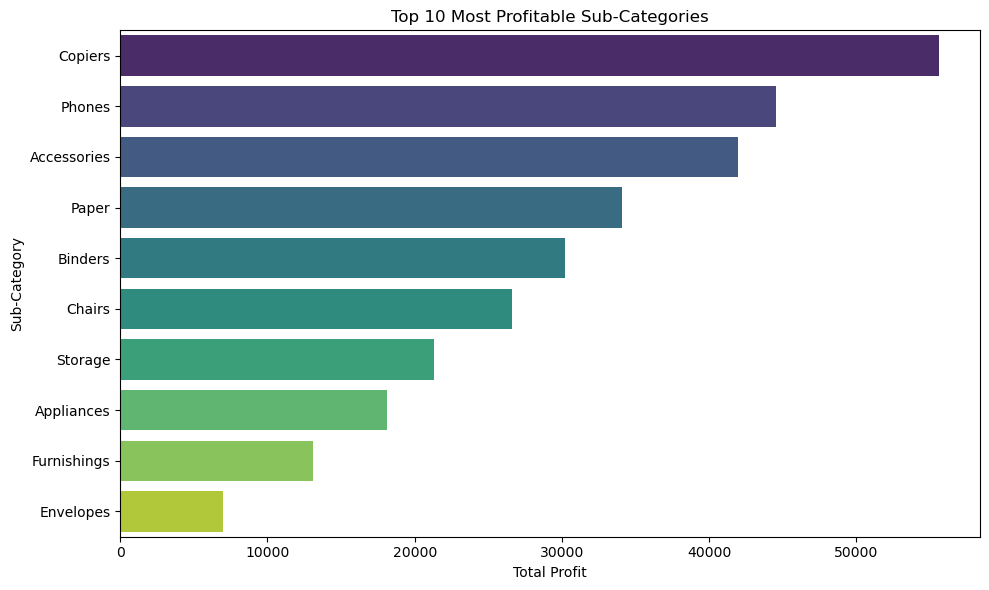

In [10]:
# Visualizing
plt.figure(figsize=(10, 6))
sns.barplot(x=sub_categories.values, y=sub_categories.index, hue = sub_categories.index, palette ='viridis', legend = False)
plt.title('Top 10 Most Profitable Sub-Categories')
plt.xlabel('Total Profit')
plt.ylabel('Sub-Category')
plt.tight_layout()
plt.show()

The above figure displays the top 10 most profitable Sub-Categories by the profits made.
Showing that Copiers are the most profitable amongst the states...

In [11]:
# profits Made by States
profit_by_state = df.groupby('State')['Profit'].sum().sort_values()
profit_by_state

State
Texas                  -25729.3563
Ohio                   -16971.3766
Pennsylvania           -15559.9603
Illinois               -12607.8870
North Carolina          -7490.9122
Colorado                -6527.8579
Tennessee               -5341.6936
Arizona                 -3427.9246
Florida                 -3399.3017
Oregon                  -1190.4705
Wyoming                   100.1960
West Virginia             185.9216
North Dakota              230.1497
South Dakota              394.8283
Maine                     454.4862
Idaho                     826.7231
Kansas                    836.4435
District of Columbia     1059.5893
New Mexico               1157.1161
Iowa                     1183.8119
New Hampshire            1706.5028
South Carolina           1769.0566
Montana                  1833.3285
Nebraska                 2037.0942
Louisiana                2196.1023
Vermont                  2244.9783
Utah                     2546.5335
Mississippi              3172.9762
Nevada        

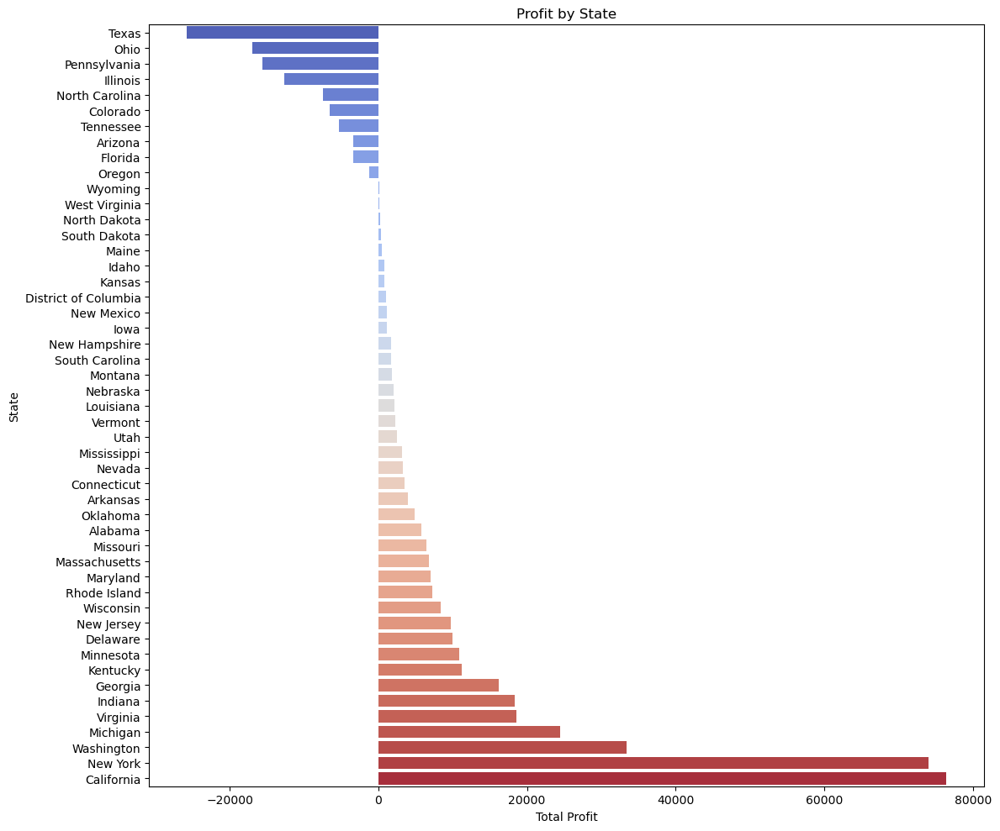

In [12]:
# bbar plot visualization
plt.figure(figsize=(12, 10))
sns.barplot(x=profit_by_state.values, y=profit_by_state.index, hue = profit_by_state.index, palette='coolwarm', legend = False)
plt.title('Profit by State')
plt.xlabel('Total Profit')
plt.ylabel('State')
plt.tight_layout()
plt.show()

The figure above shows the profits made by states.
This shows From Texas to Oregon encoutered losses with Texas encountering the highest loss while from Wyoming to Calfornia encountered profits with California encountering the highest profit.

In [14]:
# Convert Series to DataFrame and reset index
state_profit = profit_by_state.reset_index()
state_profit.columns = ['State', 'Profit']
state_profit.head(3)

,State,Profit
0,Texas,-25729.3563
1,Ohio,-16971.3766
2,Pennsylvania,-15559.9603


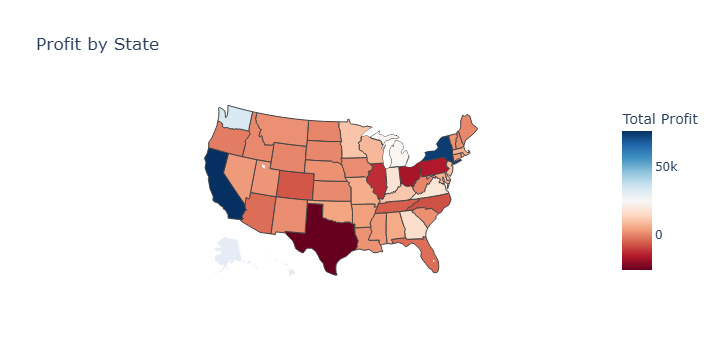

In [15]:
# Map visualization

# Adding state abbreviations (needed for the map)
state_profit['State Code'] = state_profit['State'].apply(lambda x: us.states.lookup(x).abbr if us.states.lookup(x) else None)

# Dropping rows where State Code couldn't be found
state_profit.dropna(subset=['State Code'], inplace=True)

# Plotting the choropleth map

fig = px.choropleth(
    state_profit,
    locations='State Code',
    locationmode='USA-states',
    color='Profit',
    scope='usa',
    color_continuous_scale='RdBu',
    labels={'Profit': 'Total Profit'},
    title='Profit by State'
)


fig.show()

The figure above shows the Map view profit by State.

In [16]:
# Monthly Sales & Profits Trends
df['Month'] = df['Order Date'].dt.to_period('M').dt.to_timestamp()
monthly = df.groupby('Month')[['Sales', 'Profit']].sum()

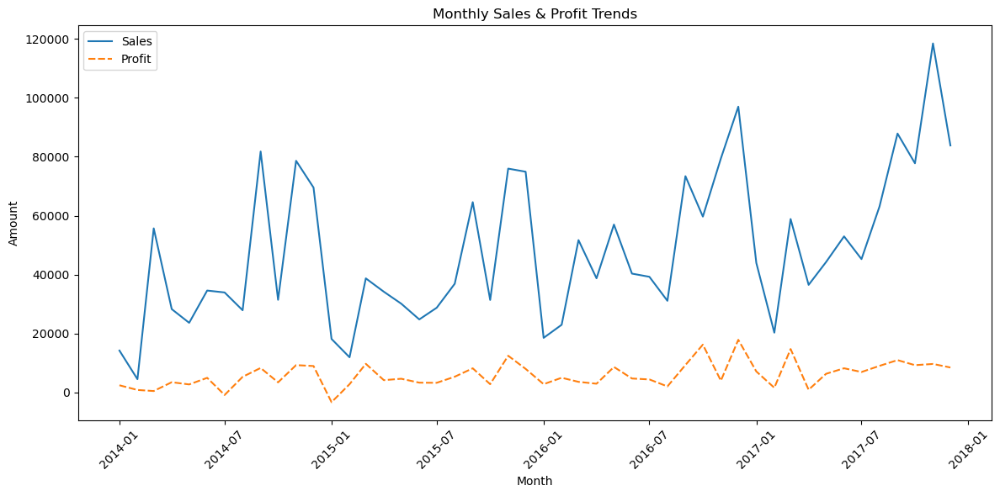

In [17]:
# Visualizing
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly, palette='tab10')
plt.title('Monthly Sales & Profit Trends')
plt.xlabel('Month')
plt.ylabel('Amount')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

This figure explains the monthly sales and profit trends semi-annually from January 2014 all to January 2018

In [18]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

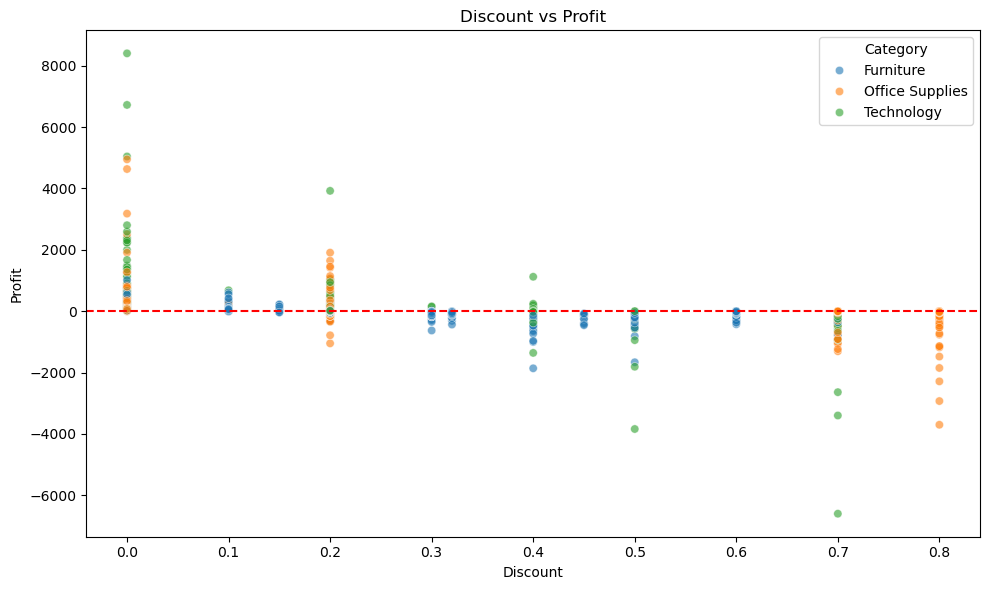

In [19]:
# Discount Vs Profits

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Discount', y='Profit', hue='Category', alpha=0.6)
plt.title('Discount vs Profit')
plt.xlabel('Discount')
plt.ylabel('Profit')
plt.axhline(0, color='red', linestyle='--')
plt.tight_layout()
plt.show()

In [20]:
df['Segment'].head(2)

0    Consumer
1    Consumer
Name: Segment, dtype: object

In [21]:
# Sales by segment
segment_sales = df.groupby('Segment')['Sales'].sum()
segment_sales

Segment
Consumer       1.161401e+06
Corporate      7.061464e+05
Home Office    4.296531e+05
Name: Sales, dtype: float64

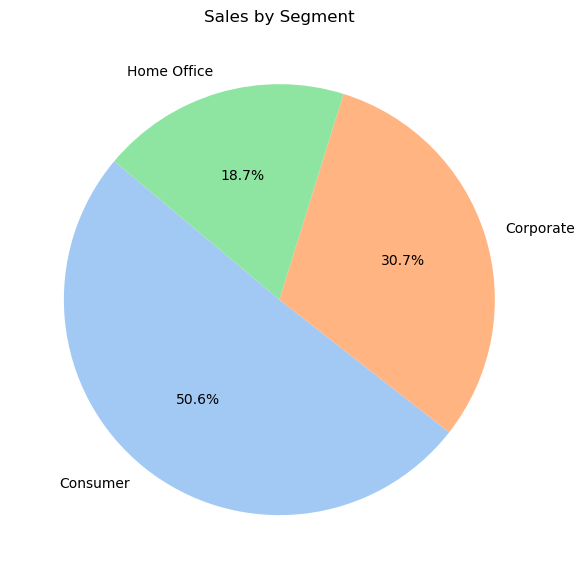

In [22]:
# Pie chart visualization
plt.figure(figsize=(6, 6))
plt.pie(segment_sales, labels=segment_sales.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Sales by Segment')
plt.tight_layout()
plt.show()

This Pie Chart reveals the percentage of users that purchase the products
This clearly indicate that Consumers purchases the highest followed by Corporate and Home Office.

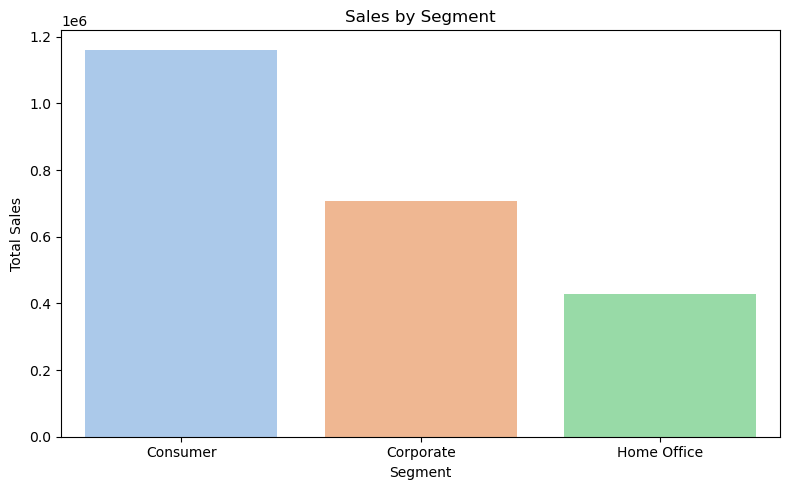

In [23]:
# Bar Chart Visualization
plt.figure(figsize=(8, 5))
sns.barplot(x=segment_sales.index, y=segment_sales.values, hue=segment_sales.index, palette='pastel', legend=False)
plt.title('Sales by Segment')
plt.xlabel('Segment')
plt.ylabel('Total Sales')
plt.tight_layout()
plt.show()

In [24]:
# Correlation Heatmap
numeric_df =df.select_dtypes(include=['float64', 'int64'])

# correlation matrix
corr = numeric_df.corr()
corr

,Row ID,Postal Code,Sales,Quantity,Discount,Profit
Row ID,1.000000,0.009671,-0.001359,-0.004016,0.013480,0.012497
Postal Code,0.009671,1.000000,-0.023854,0.012761,0.058443,-0.029961
Sales,-0.001359,-0.023854,1.000000,0.200795,-0.028190,0.479064
Quantity,-0.004016,0.012761,0.200795,1.000000,0.008623,0.066253
Discount,0.013480,0.058443,-0.028190,0.008623,1.000000,-0.219487
Profit,0.012497,-0.029961,0.479064,0.066253,-0.219487,1.000000


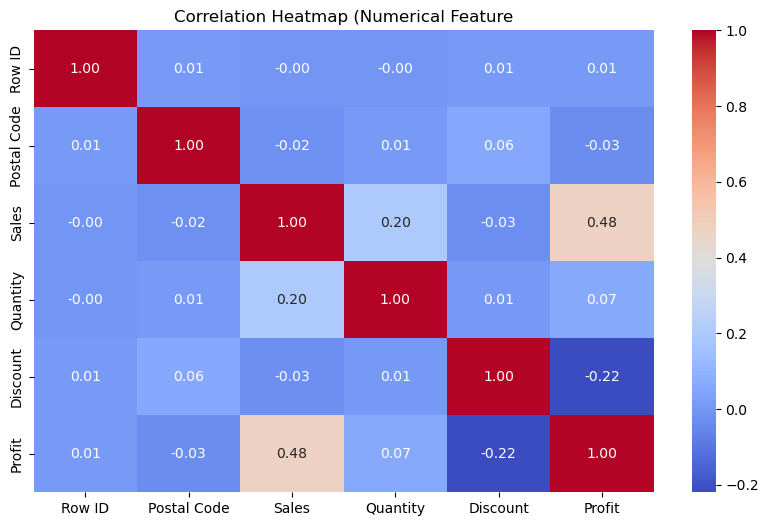

In [25]:
#visualizing correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap (Numerical Feature')
plt.show()

this Correlation visualization shows how Sales and Profit give a Moderate Positive Correlation and Discount and Sales also give a weak negative correlation.

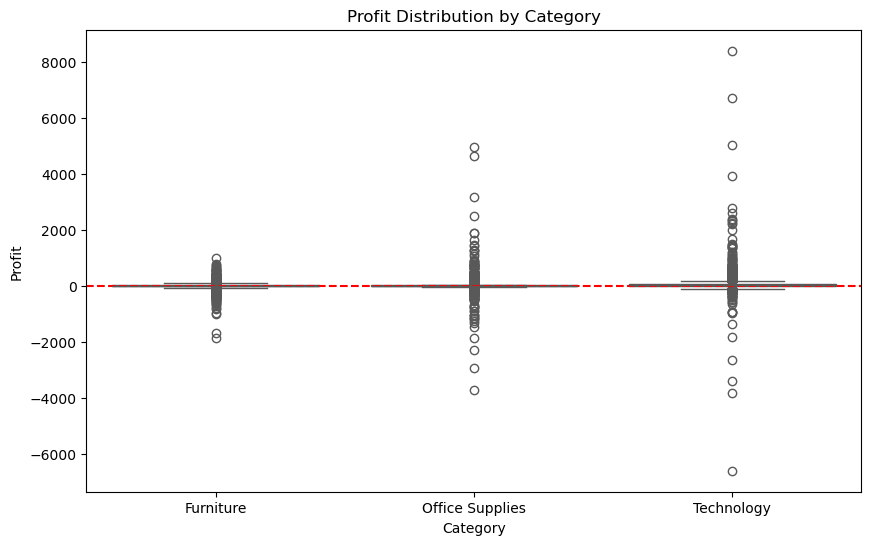

In [26]:
# Profit Distribution by Category

plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Category', y='Profit', hue = 'Category', palette='Set2', legend=False)
plt.title('Profit Distribution by Category')
plt.ylabel('Profit')
plt.xlabel('Category')
plt.axhline(0, color='red', linestyle='--')
plt.show()

This Boxplot shows that Technology category has made higher profits than the others.

In [27]:
# Top Loss-Making Products
loss_products = (
    df.groupby("Sub-Category")["Profit"]
    .sum()
    .sort_values()
    .head(10)
)

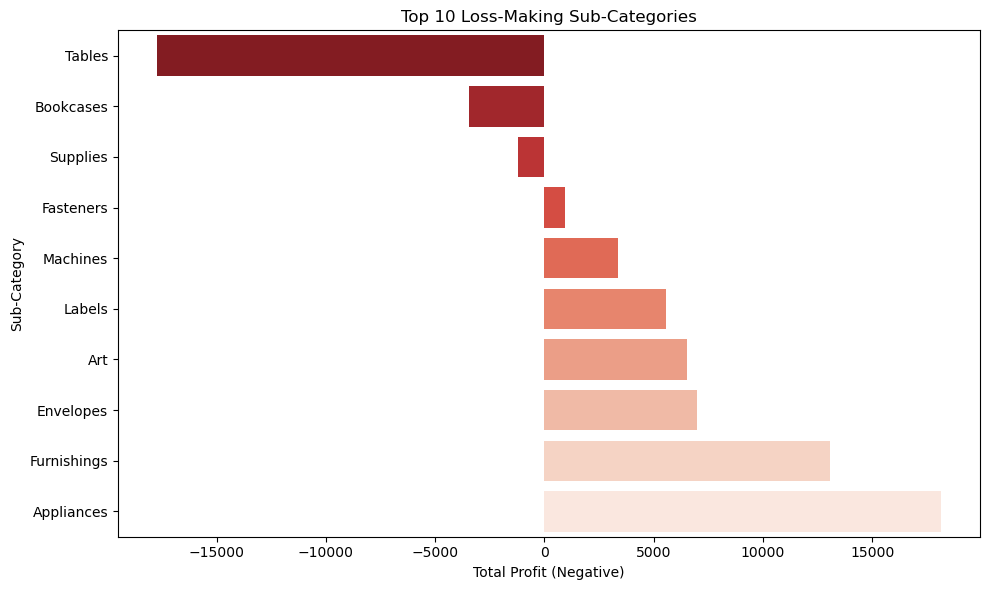

In [28]:
# Visualization for Top-loss Making Sub-Categories

plt.figure(figsize=(10, 6))
sns.barplot(x=loss_products.values, y=loss_products.index, hue=loss_products.index, palette="Reds_r", legend=False)
plt.title("Top 10 Loss-Making Sub-Categories")
plt.xlabel("Total Profit (Negative)")
plt.ylabel("Sub-Category")
plt.tight_layout()
plt.show()

The figure above show the low income producing Sub-Categories and it reaveals that Tables produces the highest loss.

In [29]:
# Regional Sales Growth Trend
regional_trends = (
    df.groupby(["Region", "YearMonth"])["Sales"]
    .sum()
    .reset_index()
)

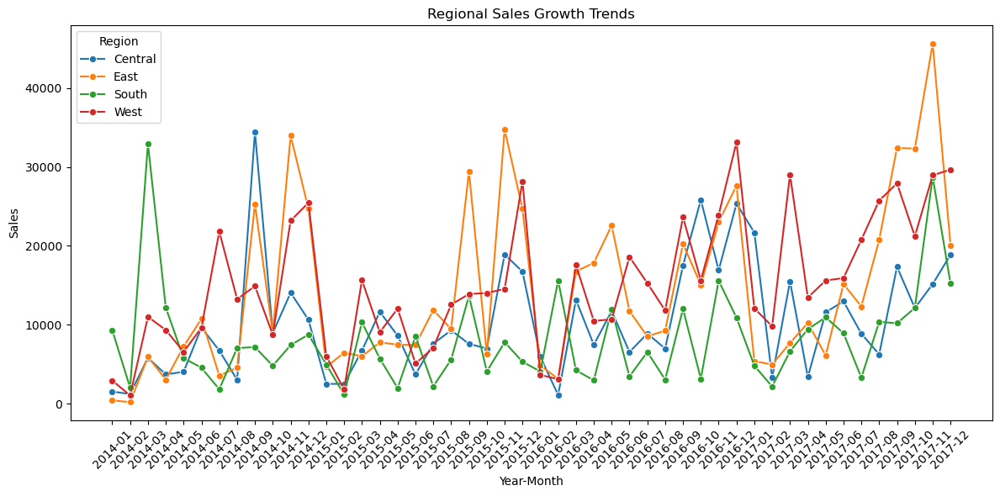

In [30]:
# Visualizing the Regional Sales Growth Trend

plt.figure(figsize=(12, 6))
sns.lineplot(data=regional_trends, x="YearMonth", y="Sales", hue="Region", marker="o")
plt.title("Regional Sales Growth Trends")
plt.xlabel("Year-Month")
plt.ylabel("Sales")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The figure above shows the Regional Sales Growth Trends.
The South Region had a massive growth from the early part of the 2014 and dropped during mid 2014. Though it had ups and downs during the subsequent months but it still turned out to have the least sales in the end.

The West Region started small but is still growing in the trend. Though it also had some ups and downs but it managed get the highest sales at the end of 2017.

The Central also started with little sales and had the highest sales in August, 2014 just after having the least sales the previous month and then dropped again but still strived to be above the region with least sales.

The East Region also started as the region with the least sales for the early part of 2014 and strived to have the highest sales latter part of 2014. It dropped again but gained the highest sales twice in latter part of 2015. It also had the highest sales mid 2016 and also had the highest sales in latter part of 2017. Though gaining the second best highest, East region has gained the highest sales in at least one in every year.

## YData-Profiling for EDA

In [ ]:
!pip install ydata-profiling

In [31]:
# importing library
from ydata_profiling import ProfileReport

In [32]:
profile = ProfileReport(df, title="Extra Credit Data Analysis on SuperStore Dataset", explorative = True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 23/23 [00:01<00:00, 11.75it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]